# Training a 2D Unet to recover 3D cells from a Tetrapod snapshot

## Import Libraries

In [2]:
## autoreloading
%load_ext autoreload
%autoreload 2

## Standard libraries
import os
import numpy as np
import pickle
import random
import enum
from skimage import io
from skimage.filters import gaussian
from PIL import Image
from tifffile import imwrite
import time
import glob
from pathlib import Path

## multiprocessing stuff
import multiprocessing

## Imports for plotting
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
# %matplotlib inline
%matplotlib notebook

## Plotly for animations 
import plotly.express as px

## Progress bar
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn.functional as F

## Torchvision
import torchvision
from torchvision import transforms
import torchvision.transforms as T
import torchvision.transforms.functional as TF
import random

## TorchIO
import torchio as tio

## MONAI
from monai.networks.nets import BasicUNet, UNet

## Determinstic training
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

## autoreload
%reload_ext autoreload

## Training parameters

In [2]:
# Device to use for training
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

# grid size in Z
Dinit = 60  # original number of slices in each pre-processed stack
Dc = 50  # number of slices in Z after throwing away extras for focus augmentation
Dextra = (Dinit - Dc)//2  # number of slices to throw away from each side

# option for uneven cropping in z
Dextra_low  = Dextra  # number of slices to throw away from below
Dextra_high = Dextra  # number of slices to throw away from top

# training parameters
train_params = {
    'device': device,
    'crop_size': (Dc,160,160),  # DxHxW
    'batch_size': 32,
    'lr': 0.001,
    'num_epochs': 200,
    'num_workers': 0,
    'training_split_ratio': 0.9,  # use 90% of samples for training, 10% for testing
    'samples_per_volume': 5,
    'max_queue_length': 40,
    'seed': 42}  # for reproducibility

# setting the seed
random.seed(train_params['seed'])
torch.manual_seed(train_params['seed'])

## Transforms

### Correct dimension ordering

In [3]:
# transform permutes the dimension to compyl with the pytorch convention of DxHxW
class MyTransform(tio.transforms.Transform):
    def apply_transform(self, subject):
        st = subject['ST'][tio.DATA]
        tp = subject['TP'][tio.DATA]
        st = st.permute(0,3,2,1)
        tp = tp.permute(0,3,2,1)
        subject['ST'][tio.DATA] = st
        subject['TP'][tio.DATA] = tp
        return subject

# dimension correcting transform
my_transform = MyTransform()

### Normalization

In [4]:
# normalization of data with percentiles to avoid single cell sensitivity
norm_transform = tio.RescaleIntensity(out_min_max=(0, 1), percentiles=(0.5, 99.95), exclude='ST')

### Intensity augmentation

In [5]:
# normalization to augment sensitivity to exponentiation of intensity
gamma_transform = tio.RandomGamma(log_gamma=(-0.3, 0.3), p=0.5)  # gamma between 0.74 and 1.34

### Focus shifting in Z

In [6]:
# define the transform that shifts the z-range to tolerate some inaccuracy in focus finding
class FocusTransform(tio.transforms.Transform):
    def apply_transform(self, subject):
        
        # extract current cells and masks 
        st = subject['ST'][tio.DATA]
        tp = subject['TP'][tio.DATA]
        
        # shift both stacks up or down and crop extras
        st_shift = st[:,Dextra_low:-Dextra_high]
        tp_shift = tp[:,Dextra_low:-Dextra_high]
        
        # save shifted cells and masks
        subject['ST'][tio.DATA] = st_shift
        subject['TP'][tio.DATA] = tp_shift
        return subject

# focus shifting in z transform
focus_transform = FocusTransform()

### Composed train/valid transforms

In [7]:
# compose all transforms together
transforms_train = tio.Compose([
    my_transform,
    norm_transform,
    gamma_transform,
    focus_transform,
])

# for validation only normalize 
transforms_valid = tio.Compose([
    my_transform,
    norm_transform,
    focus_transform,
])

## Subjects Dataset

### Pre-processed training set

In [8]:
# masking the deconvolutiojns to get the cells
folder_path_st = 'Exp Dataset/Training/CM/'
folder_path_tp = 'Exp Dataset/Training/TP/'
filenames_st = np.sort(glob.glob(folder_path_st + '*.tif'))
filenames_tp = np.sort(glob.glob(folder_path_tp + '*.tif'))

### Split to train/valid 

In [9]:
# create subjects out of my paths
subjects = []
for i, (st_path, tp_path) in enumerate(zip(filenames_st, filenames_tp)):
    subject = tio.Subject(
        ST=tio.ScalarImage(st_path),
        TP=tio.ScalarImage(tp_path)
    )
    subjects.append(subject)
num_spheroids = len(subjects)
print('Dataset size:', num_spheroids, 'spheroids')

# split into train/valid sets
num_train = int(train_params['training_split_ratio'] * num_spheroids)
num_valid = num_spheroids - num_train
torch.manual_seed(torch.initial_seed())
train_subjects, valid_subjects = torch.utils.data.random_split(subjects, (num_train, num_valid))

# make datasets out of the splitted spheroids
train_set = tio.SubjectsDataset(train_subjects, transform=transforms_train)
valid_set = tio.SubjectsDataset(valid_subjects, transform=transforms_valid)
print('Training set:', len(train_set), 'spheroids')
print('Validation set:', len(valid_set), 'spheroids')

Dataset size: 592 spheroids
Training set: 532 spheroids
Validation set: 60 spheroids


## Patch-based data loaders

In [10]:
# patch sampler
sampler = tio.data.UniformSampler(patch_size=train_params['crop_size'])

# queue dataset
patches_train_set = tio.Queue(
    subjects_dataset=train_set,
    max_length=train_params['max_queue_length'],
    samples_per_volume=train_params['samples_per_volume'],
    sampler=sampler,
    num_workers=8,
    shuffle_subjects=True,
    shuffle_patches=True,
    verbose=False,
)

patches_valid_set = tio.Queue(
    subjects_dataset=valid_set,
    max_length=train_params['max_queue_length'],
    samples_per_volume=train_params['samples_per_volume'],
    sampler=sampler,
    num_workers=8,
    shuffle_subjects=False,
    shuffle_patches=False,
    verbose=False,
)

# patch loaders
train_loader_patches = torch.utils.data.DataLoader(patches_train_set, batch_size=train_params['batch_size'], num_workers=0)
valid_loader_patches = torch.utils.data.DataLoader(patches_valid_set, batch_size=2*train_params['batch_size'], num_workers=0)

## Training code

### Pred-trained focus estimation model

In [11]:
# focus model is a unet with global avg pool at the output
class ModelFocus(nn.Module):
    def __init__(self):
        super(ModelFocus, self).__init__()
        self.base_model = BasicUNet(spatial_dims=2,
                                    in_channels=1,
                                    out_channels=64,
                                    features=(64, 64, 128, 256, 512, 64))
        self.out_layers = nn.Sequential(nn.AdaptiveAvgPool2d(output_size=1), 
                                        nn.Conv2d(64, 1, kernel_size=1))
    def forward(self, x):
        return self.out_layers(self.base_model(x)).squeeze()

# instantiate model and transfer to device
model_focus = ModelFocus()
model_focus = model_focus.to(device)

# load pretrained weights and put on eval mode
ckpt = torch.load('Models/Focus_finder_TP_model_best_ckpt.pth')
model_focus.load_state_dict(ckpt['weights'])
model_focus.eval()

# ensure that all focus model parameters do not require gradients
for param in model_focus.parameters():
    param.requires_grad = False

BasicUNet features: (64, 64, 128, 256, 512, 64).


### Focus normalization function

In [12]:
# parameters defining discretization in z
pz = 4  # pixel size in z in [um]
focus_mid = torch.LongTensor([20]).to(device)  # focal position of the optimal TP slice assuming no shift
focus_rng = torch.LongTensor([0, 35]).to(device)  # range of interesting focal positions in slices of pz microns
two = torch.LongTensor([2]).to(device)

# normalization functions for the focus
def normalize_focus(f, fmid, frng): return (f - fmid)/((frng[1] - frng[0])/two)
def unnormalize_focus(f, fmid, frng): return f*(frng[1] - frng[0])/two + fmid

### Batch prep. function

In [13]:
# preparing a single batch from the training loader
eps = torch.FloatTensor([1e-8]).to(device)
thresh = torch.FloatTensor([0.1]).to(device)
def prepare_batch(batch, device):
    st = batch['ST'][tio.DATA].to(device)
    tp = batch['TP'][tio.DATA].to(device)
    st = st.squeeze(1)
    st = torch.where(st >= thresh, torch.ones_like(st), torch.zeros_like(st))
    batch_size, C, D, H, W = tp.shape
    focus_tp = torch.randint(low=focus_rng[0], high=focus_rng[1]+1, size=(batch_size,)).to(device)
    tp2d = torch.gather(tp, 2, focus_tp.view(batch_size,1,1,1,1).expand(batch_size,C,1,H,W)).squeeze(1)
    tp2d = (tp2d - tp2d.mean(dim=(-1,-2), keepdim=True))/(tp2d.std(dim=(-1,-2), keepdim=True) + eps)
    with torch.set_grad_enabled(False):
        focus_tp_est = model_focus(tp2d)
    f2d = focus_tp_est.view(batch_size,1,1,1).expand(batch_size,C,H,W)
    return tp2d, f2d, st

### Architecture 

In [14]:
model = BasicUNet(spatial_dims=2,
                  in_channels=2,
                  out_channels=Dc,
                  features=(64, 64, 128, 256, 512, 64)).to(device)

BasicUNet features: (64, 64, 128, 256, 512, 64).


### Optimizer

In [15]:
optimizer = torch.optim.AdamW(model.parameters(), lr=train_params['lr'])

### Loss function

In [17]:
# dice score calculation (assuming binary volumes)
def get_dice_score(output, target, epsilon=1e-9):
    p0 = output
    g0 = target
    p1 = 1 - p0
    g1 = 1 - g0
    tp = (p0 * g0).sum(dim=(1,2,3))
    fp = (p0 * g1).sum(dim=(1,2,3))
    fn = (p1 * g0).sum(dim=(1,2,3))
    num = 2 * tp
    denom = 2 * tp + fp + fn + epsilon
    dice_score = num / denom
    return dice_score

# dice loss
def get_dice_loss(output, target):
    return 1 - get_dice_score(output, target)

# multi-scale dice loss
def multiscale_dice_loss(output, target, scales=[1]):
    if scales is [1]:
        return get_dice_loss(output, target)
    else:
        losses_scales = []
        for s in scales:
            if s==1:
                losses_scales.append(get_dice_loss(output, target))
            else:  
                output_s = F.max_pool3d(output.unsqueeze(1), kernel_size=(s,1,1), stride=(s,1,1), padding=(0,0,0))
                target_s = F.max_pool3d(target.unsqueeze(1), kernel_size=(s,1,1), stride=(s,1,1), padding=(0,0,0))
                losses_scales.append(get_dice_loss(output_s.squeeze(1), target_s.squeeze(1)))
    return sum(losses_scales)/len(scales)

### Train/valid epoch

In [18]:
# helper class for epoch mode
class Action(enum.Enum):
    TRAIN = 'Training'
    VALIDATE = 'Validation'

# running a single epoch (train/valid)
def run_epoch(epoch_idx, action, loader, model, optimizer):
    is_training = action == Action.TRAIN
    epoch_losses = []
    model.train(is_training)
    for batch_idx, batch in enumerate(tqdm(loader)):

        # prepare current data batch on GPU
        tp2d, f2d, st = prepare_batch(batch, device)
        
        # concatenate the TP and the Focus channels
        tp2d = torch.cat((tp2d, f2d), axis=1)
        
        # optimization step
        optimizer.zero_grad()
        with torch.set_grad_enabled(is_training):
            outputs = torch.sigmoid(model(tp2d))
            batch_losses = get_dice_loss(outputs, st)
            batch_loss = batch_losses.mean()
            if is_training:
                batch_loss.backward()
                optimizer.step()
            epoch_losses.append(batch_loss.item())
    epoch_losses = np.array(epoch_losses)
    print(f'{action.value} mean loss: {epoch_losses.mean():0.3f}')
    return epoch_losses

### Train/valid loop

In [19]:
# training function for multiple epochs
def train(num_epochs, train_loader, valid_loader, model, optimizer, weights_name):
    train_losses, val_losses = [], []
    min_val_loss, num_no_improve = 2.**10, 0
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=10, min_lr=5*1e-5, verbose=True)
    for epoch_idx in range(1, num_epochs + 1):
        print('='*50)
        print('Starting epoch', epoch_idx)
        print('='*50)
        train_losses.append(run_epoch(epoch_idx, Action.TRAIN, train_loader, model, optimizer))
        val_losses.append(run_epoch(epoch_idx, Action.VALIDATE, valid_loader, model, optimizer))
        curr_val_loss = val_losses[-1].mean()
        scheduler.step(curr_val_loss)
        num_no_improve += 1
        if curr_val_loss <= min_val_loss:
            checkpoint = {'train_losses': train_losses,
                          'val_losses': val_losses,
                          'weights': model.state_dict(),
                          'optimizer': optimizer.state_dict()}
            torch.save(checkpoint, f'{weights_name}_model_best_ckpt.pth')
            min_val_loss = curr_val_loss
            num_no_improve = 0
        if num_no_improve > 20:
            break
    return np.array(train_losses), np.array(val_losses)

## Run training

### Train for 100 epochs

In [20]:
# train
weights_name = 'Models/Cellsnap_3D_segmentor_TP'
ts = time.time()
train_losses, val_losses = train(train_params['num_epochs'], train_loader_patches, valid_loader_patches, 
                                 model, optimizer, weights_name)
tf = time.time()
print('Training for {} epochs took {:.2f} Seconds'.format(train_params['num_epochs'], tf-ts))

# save the entire run
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, weights_name + '_entire_run.pth')

Starting epoch 1


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.823


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.736
Starting epoch 2


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.626


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.560
Starting epoch 3


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.519


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.511
Starting epoch 4


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.482


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.484
Starting epoch 5


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.469


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.480
Starting epoch 6


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.457


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.467
Starting epoch 7


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.450


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.468
Starting epoch 8


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.444


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.453
Starting epoch 9


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.439


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.440
Starting epoch 10


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.432


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.451
Starting epoch 11


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.431


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.448
Starting epoch 12


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.428


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.450
Starting epoch 13


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.424


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.445
Starting epoch 14


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.423


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.431
Starting epoch 15


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.419


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.423
Starting epoch 16


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.413


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.435
Starting epoch 17


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.417


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.426
Starting epoch 18


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.412


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.425
Starting epoch 19


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.413


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.417
Starting epoch 20


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.409


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.416
Starting epoch 21


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.406


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.430
Starting epoch 22


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.406


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.421
Starting epoch 23


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.407


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.408
Starting epoch 24


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.404


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.409
Starting epoch 25


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.399


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.409
Starting epoch 26


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.398


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.410
Starting epoch 27


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.396


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.402
Starting epoch 28


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.397


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.415
Starting epoch 29


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.398


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.400
Starting epoch 30


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.397


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.395
Starting epoch 31


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.394


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.396
Starting epoch 32


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.392


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.399
Starting epoch 33


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.393


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.414
Starting epoch 34


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.393


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.402
Starting epoch 35


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.395


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.405
Starting epoch 36


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.389


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.401
Starting epoch 37


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.387


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.405
Starting epoch 38


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.397


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.403
Starting epoch 39


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.389


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.405
Starting epoch 40


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.386


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.405
Starting epoch 41


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.390


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.391
Starting epoch 42


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.387


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.421
Starting epoch 43


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.383


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.389
Starting epoch 44


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.385


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.398
Starting epoch 45


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.384


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.394
Starting epoch 46


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.387


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.398
Starting epoch 47


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.383


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 48


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.378


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.391
Starting epoch 49


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.379


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.404
Starting epoch 50


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.381


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.395
Starting epoch 51


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.380


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.388
Starting epoch 52


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.379


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.397
Starting epoch 53


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.378


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.396
Starting epoch 54


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.379


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.388
Starting epoch 55


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.375


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 56


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.380


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.394
Starting epoch 57


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.378


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.385
Starting epoch 58


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.374


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.393
Starting epoch 59


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.375


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.394
Starting epoch 60


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.375


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.385
Starting epoch 61


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.372


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.380
Starting epoch 62


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.371


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.392
Starting epoch 63


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.374


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.381
Starting epoch 64


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.371


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 65


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.383
Starting epoch 66


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.371


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 67


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.372


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.389
Starting epoch 68


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.372


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.399
Starting epoch 69


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.374


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.382
Starting epoch 70


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.386
Starting epoch 71


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.368


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.388
Starting epoch 72


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.372


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.386
Epoch 00072: reducing learning rate of group 0 to 1.0000e-04.
Starting epoch 73


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.359


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.371
Starting epoch 74


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.356


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 75


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.354


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 76


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Starting epoch 77


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.354


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 78


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.353


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.377
Starting epoch 79


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.353


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Starting epoch 80


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.353


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 81


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.370
Starting epoch 82


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.377
Starting epoch 83


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.369
Starting epoch 84


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.353


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 85


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 86


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Starting epoch 87


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 88


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Starting epoch 89


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.373
Starting epoch 90


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 91


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.370
Starting epoch 92


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.348


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 93


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.349


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 94


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.348


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Epoch 00094: reducing learning rate of group 0 to 5.0000e-05.
Starting epoch 95


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.348


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 96


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 97


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.347


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.371
Starting epoch 98


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.347


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.377
Starting epoch 99


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.367
Starting epoch 100


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.345


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 101


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 102


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.373
Starting epoch 103


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.370
Starting epoch 104


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.380
Starting epoch 105


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 106


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.345


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.379
Starting epoch 107


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.379
Starting epoch 108


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 109


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.345


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 110


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.376
Starting epoch 111


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 112


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 113


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 114


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.341


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 115


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 116


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 117


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.344


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 118


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Starting epoch 119


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.371
Starting epoch 120


  0%|          | 0/84 [00:00<?, ?it/s]

Training mean loss: 0.345


  0%|          | 0/5 [00:00<?, ?it/s]

Validation mean loss: 0.378
Training for 200 epochs took 9180.03 Seconds


### Plot loss

<IPython.core.display.Javascript object>


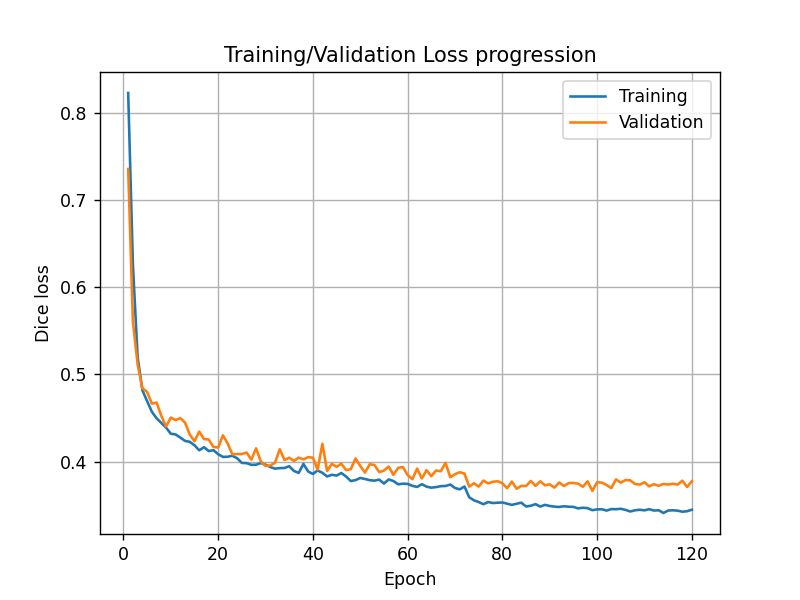

In [21]:
# average losses and epoch number
steps_train, steps_val = len(train_losses[0]), len(val_losses[0])
epoch_axis = np.arange(1,len(train_losses)+1,1)
steps_train_axis = np.arange(1,len(train_losses)+1,1/steps_train)
steps_val_axis = np.arange(1,len(val_losses)+1,1/steps_val)
avg_train_loss = [train_epoch.mean() for train_epoch in train_losses]
avg_val_loss = [valid_epoch.mean() for valid_epoch in val_losses]

# plot the losses vs epochs and steps
plt.figure()
plt.plot(epoch_axis, avg_train_loss, label='Training')
plt.plot(epoch_axis, avg_val_loss, label='Validation')
plt.grid()
plt.xlabel('Epoch')
plt.ylabel('Dice loss')
plt.title('Training/Validation Loss progression')
plt.legend()
plt.show()

## Sanity check: Validation set

### Transfering from torch to numpy

In [27]:
# function to transfer stuff to numpy
def to_np(tensor):
    return tensor.cpu().numpy().squeeze()

### Load best weights from checkpoint

In [29]:
# load saved checkpoint
ckpt = torch.load(weights_name + '_model_best_ckpt.pth')
model.load_state_dict(ckpt['weights'])
model.eval()

<All keys matched successfully>

### Analyze subjects 1 by 1 - Focus random 

In [30]:
# get subjects one by one
inputs, outputs, targets, foci = [], [], [], []
ts_all = time.time()
for i in range(len(valid_set)):
    
    # time each subject
    tsi = time.time()
    
    # current test subject
    subjecti = valid_set[i]
    
    # save current inputs and targets for entire subject prior to patches
    subjecti['ST'][tio.DATA] = subjecti['ST'][tio.DATA].unsqueeze(0)
    subjecti['TP'][tio.DATA] = subjecti['TP'][tio.DATA].unsqueeze(0)
    tp2di, f2di, sti = prepare_batch(subjecti, device)
    subjecti['ST'][tio.DATA] = subjecti['ST'][tio.DATA].squeeze(0)
    subjecti['TP'][tio.DATA] = tp2di.cpu().repeat(1,sti.shape[-3],1,1)
    subjecti.add_image(tio.ScalarImage(tensor=f2di.cpu().repeat(1,sti.shape[-3],1,1)), 'FP')
    inputs.append(tp2di)
    targets.append(sti)
    foci.append(unnormalize_focus(f2di[:,0,0,0], focus_mid, focus_rng))
    
    # grid sampler, patch loader and results aggregator
    grid_sampler = tio.inference.GridSampler(subject=subjecti, patch_size=(Dc,320,320), patch_overlap=(0,40,40))
    patch_loader = torch.utils.data.DataLoader(grid_sampler, batch_size=1)
    aggregator = tio.inference.GridAggregator(grid_sampler, overlap_mode='average')
    
    # loop over all patches
    with torch.no_grad():
        for patches_batch in patch_loader:
            patch_inputs = patches_batch['TP'][tio.DATA][:,:,0].to(device)
            patch_foci = patches_batch['FP'][tio.DATA][:,:,0].to(device)
            patch_inputs = torch.cat((patch_inputs, patch_foci), axis=1)
            locations = patches_batch[tio.LOCATION]
            patch_outputs = torch.sigmoid(model(patch_inputs))
            patch_outputs = patch_outputs.unsqueeze(0)
            aggregator.add_batch(patch_outputs, locations)
    
    # average overlaps and save outputs
    outputsi = aggregator.get_output_tensor()
    outputs.append(outputsi)
    
    # report time it took to process current subject
    print(f'Subject {i} Took {time.time()-tsi:.2f} Seconds')

# overall processing time
tf_all = time.time()
print(f'All Valid Subjects Processed in {tf_all - ts_all:.2f} Seconds')

Subject 0 Took 0.31 Seconds
Subject 1 Took 0.33 Seconds
Subject 2 Took 0.30 Seconds
Subject 3 Took 0.29 Seconds
Subject 4 Took 0.31 Seconds
Subject 5 Took 0.29 Seconds
Subject 6 Took 0.27 Seconds
Subject 7 Took 0.27 Seconds
Subject 8 Took 0.29 Seconds
Subject 9 Took 0.29 Seconds
Subject 10 Took 0.27 Seconds
Subject 11 Took 0.27 Seconds
Subject 12 Took 0.29 Seconds
Subject 13 Took 0.27 Seconds
Subject 14 Took 0.26 Seconds
Subject 15 Took 0.28 Seconds
Subject 16 Took 0.27 Seconds
Subject 17 Took 0.29 Seconds
Subject 18 Took 0.28 Seconds
Subject 19 Took 0.28 Seconds
Subject 20 Took 0.28 Seconds
Subject 21 Took 0.27 Seconds
Subject 22 Took 0.29 Seconds
Subject 23 Took 0.26 Seconds
Subject 24 Took 0.28 Seconds
Subject 25 Took 0.27 Seconds
Subject 26 Took 0.28 Seconds
Subject 27 Took 0.26 Seconds
Subject 28 Took 0.27 Seconds
Subject 29 Took 0.28 Seconds
Subject 30 Took 0.27 Seconds
Subject 31 Took 0.26 Seconds
Subject 32 Took 0.26 Seconds
Subject 33 Took 0.27 Seconds
Subject 34 Took 0.27 Sec

### Valid inputs random focus

In [35]:
# look at the different TP inputs
idx = 7
fig = px.imshow(to_np(inputs[idx]), binary_string=False, aspect='equal', title=f'Estimated Focus is {to_np(foci[idx]):.2f}')
fig.show()

### Results on input random focus


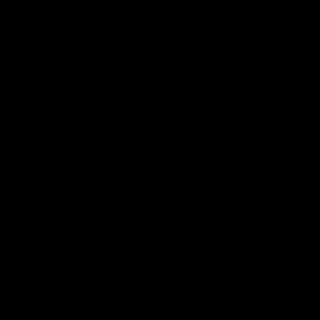
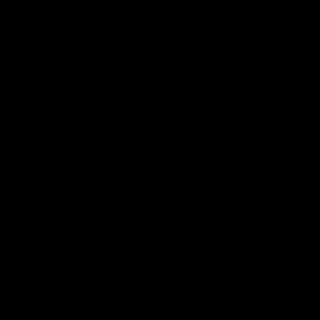
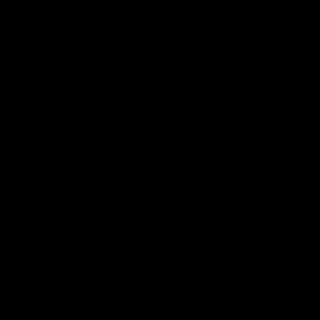
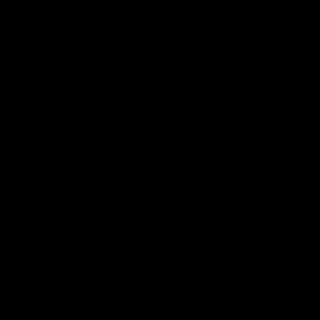
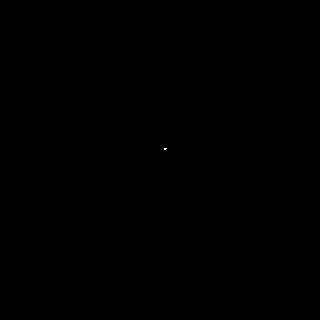
...
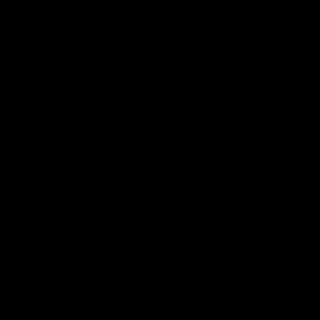
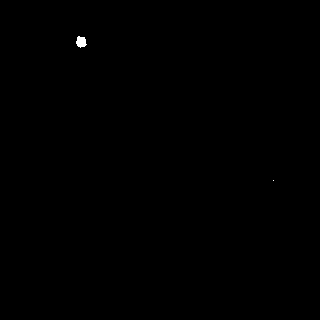
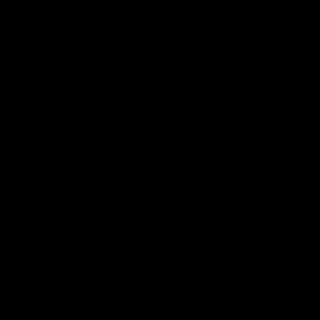
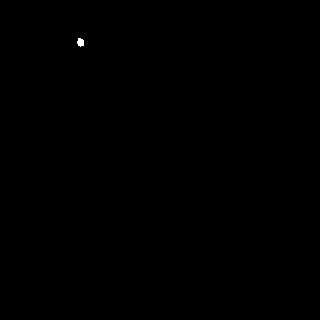
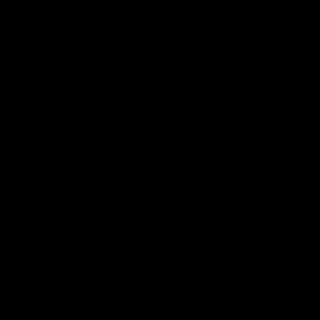

In [36]:
# plot the result vs the GT
idx = 7
cells_rec = np.stack([to_np(targets[idx]),to_np(outputs[idx])])  #  > 0.2
fig = px.imshow(cells_rec, animation_frame=1, facet_col=0, binary_string=True, 
                labels={'animation_frame':'slice','facet_col':'slice #'}, aspect='equal')
fig.layout.annotations[0]['text'] = 'GT'
fig.layout.annotations[1]['text'] = 'Rec'
fig.show()

### Saving

In [ ]:
# output folder
output_path = Path("Results/" + weights_name.split("Models/")[1] + "/Valid Sanity Check/")
if output_path.exists() is False:
    output_path.mkdir(parents=True)

In [ ]:
# imgs and names for saving
save_imgs = [inputs, targets, outputs]
save_names = ["Tetra.tiff", "Ground_truth.tiff", "Rec3D.tiff"]
metadatas = [{'axes': 'YX'}, {'axes': 'ZYX'}, {'axes': 'ZYX'}]

# for each test sampel save both sim/exp results
for i,subject_i in enumerate(valid_set):
    filename_i = str(subject_i['ST'].path)
    save_imgs_i = [to_np(im[i]) for im in save_imgs]
    stack_path = Path(os.path.join(output_path, filename_i.split(sep='/')[-1].split(sep='.tif')[0]))
    if stack_path.exists() is False: stack_path.mkdir()
    for img, name, meta in zip(save_imgs_i,save_names,metadatas):
        img_name = os.path.join(stack_path, name)
        imwrite(img_name, img.astype(np.float32), metadata=meta, imagej=True)

### Analyze subjects 1 by 1 - Focus scan 

In [38]:
# get subjects one by one
inputs_f, outputs_f, targets_f, foci_f = [], [], [], []
ts_all = time.time()
for i in range(len(valid_set)):
    
    # time each subject
    tsi = time.time()
    
    # current test subject
    subjecti = valid_set[i]
    
    # save current inputs and targets for entire subject prior to patches
    sti = subjecti['ST'][tio.DATA].to(device)
    tpi = subjecti['TP'][tio.DATA].to(device)
    sti = torch.where(sti >= thresh, torch.ones_like(sti), torch.zeros_like(sti))
    tpi = (tpi - tpi.mean(dim=(-1,-2), keepdim=True))/(tpi.std(dim=(-1,-2), keepdim=True) + eps)
    tpi = tpi[:, focus_rng[0]:(focus_rng[1]+1)]
    C, D, H, W = tpi.shape
    # focus_tpi = torch.arange(focus_rng[0],(focus_rng[1]+1)).to(device)
    # focus_tpi = normalize_focus(focus_tpi, focus_mid, focus_rng)
    with torch.no_grad():
        focus_tpi = model_focus(tpi.permute(1,0,2,3))
    fpi = focus_tpi.view(1,D,1,1).expand(C,D,H,W)
    inputs_f.append(tpi.cpu())
    targets_f.append(sti.cpu())
    foci_f.append(unnormalize_focus(focus_tpi, focus_mid, focus_rng).cpu())
    
    # permute batch and depth dimensions and concatenate TP and focus
    tpi = tpi.permute(1,0,2,3)
    fpi = fpi.permute(1,0,2,3)
    tpi = torch.cat((tpi, fpi), axis=1)
    
    # predict all focuses as a batch
    with torch.no_grad():
        outputsi = torch.sigmoid(model(tpi))
    outputs_f.append(outputsi.detach().cpu())

    # report time it took to process current subject
    print(f'Subject {i} Took {time.time()-tsi:.2f} Seconds')

# overall processing time
tf_all = time.time()
print(f'All Valid Subjects Processed in {tf_all - ts_all:.2f} Seconds')

Subject 0 Took 1.23 Seconds
Subject 1 Took 1.17 Seconds
All Valid Subjects Processed in 2.40 Seconds


### Valid inputs per focus


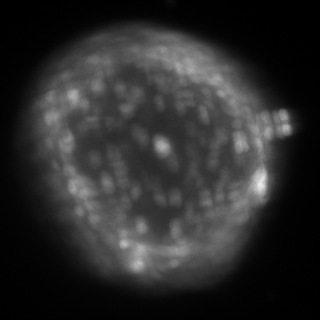
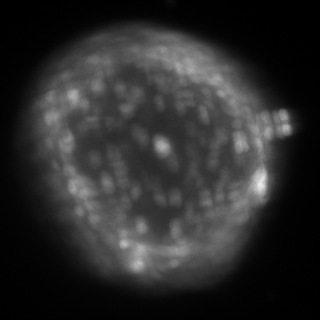
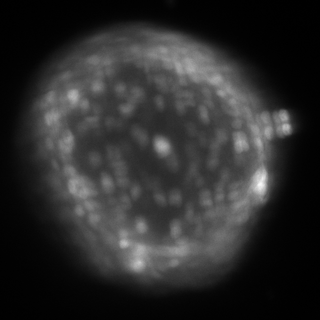
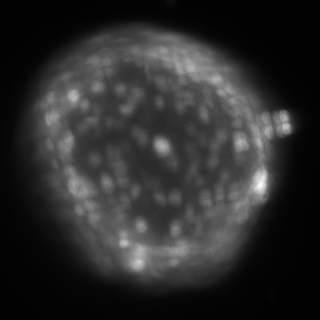
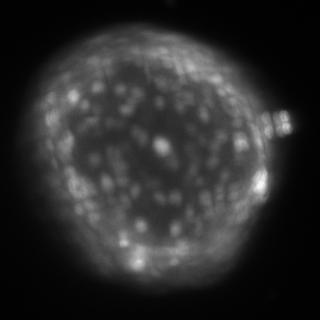
...
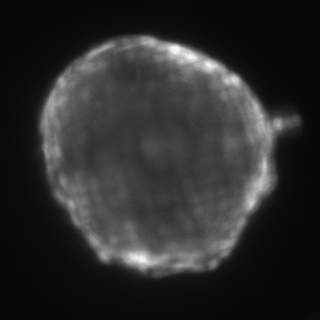
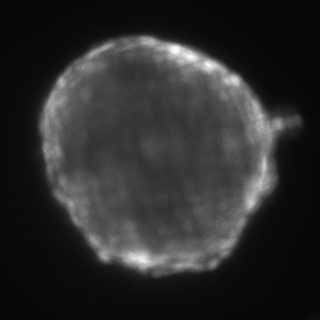
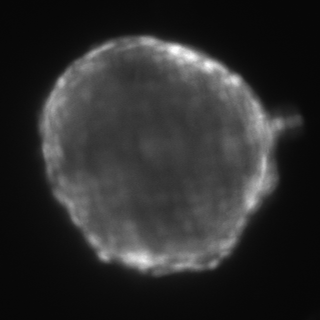
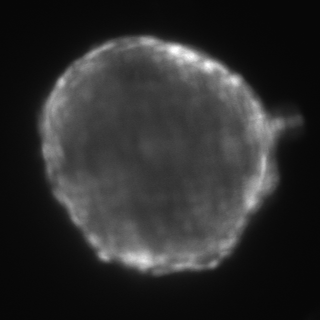
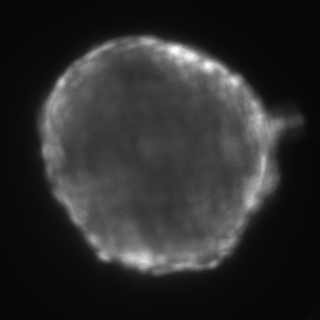

In [50]:
# index of validation spheroid
idx = 1

# look at the different TP inputs
fig = px.imshow(to_np(inputs_f[idx]), animation_frame=0, binary_string=True, aspect='equal')
fig.show()

### Quality of focus estimation

<IPython.core.display.Javascript object>


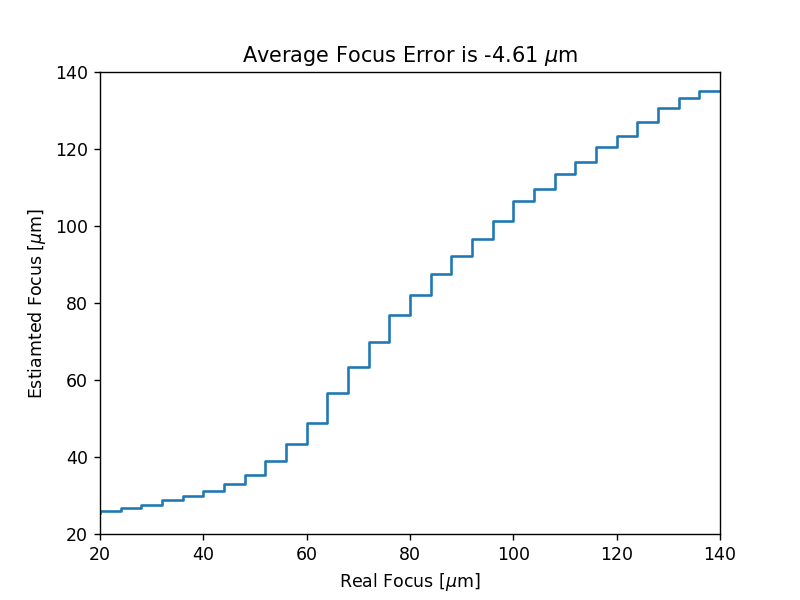

Text(0.5, 1.0, 'Average Focus Error is -4.61 $\\mu$m')

In [55]:
# index of validation spheroid
idx = 0

# estimated vs real focus
plt.figure()
plt.step(x=np.arange(5,36,1)*pz,y=to_np(foci_f[idx])*pz)
plt.xlabel("Real Focus [$\mu$m]")
plt.ylabel("Estiamted Focus [$\mu$m]")
plt.xlim([5*pz, 35*pz])
plt.ylim([5*pz, 35*pz])
plt.title(f"Average Focus Error is {np.abs(to_np(foci_f[idx])-np.arange(5,36,1)).mean()*pz:.2f} $\mu$m")

### Results on inputs per focus

<IPython.core.display.Javascript object>


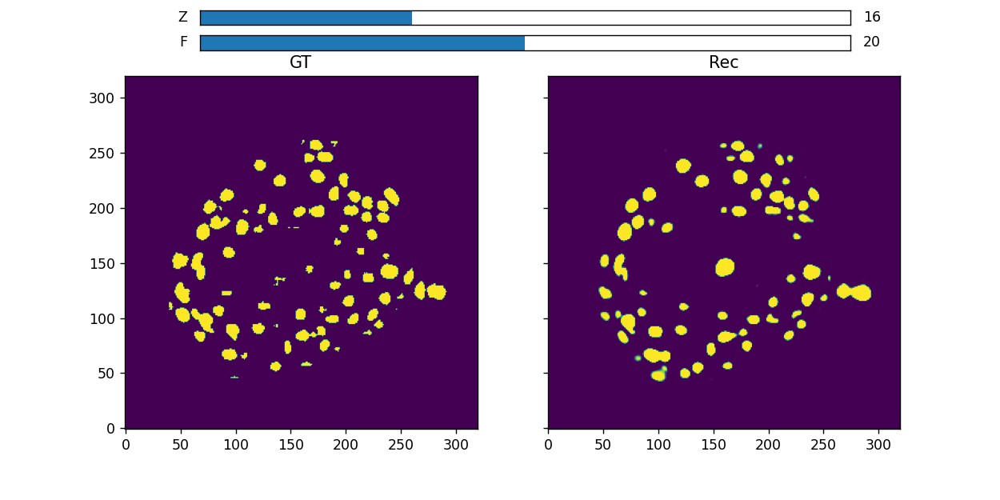

In [52]:
%matplotlib notebook

# index of validation spheroid
idx = 1

# plot the result vs the GT
target_idx, outputs_idx = to_np(targets_f[idx]), to_np(outputs_f[idx])

# subplots of GT vs Rec as function of Z and F
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(10,5))
l1 = ax1.imshow(target_idx[15,:,:], origin = 'lower')
ax1.set_title("GT")
l2 = ax2.imshow(outputs_idx[0,15,:,:], origin = 'lower')
ax2.set_title("Rec")

# sliders on Z and F
axZ = fig.add_axes([0.2, 0.95, 0.65, 0.03])
axF = fig.add_axes([0.2, 0.90, 0.65, 0.03])
sliderZ = Slider(axZ, 'Z', 0, outputs_idx.shape[1]-1, valinit=0, valfmt='%i', valstep=1)
sliderF = Slider(axF, 'F', 0+5, outputs_idx.shape[0]-1+5, valinit=0+5, valfmt='%i', valstep=1)

# update function
def update(val):
    i = int(sliderZ.val)
    j = int(sliderF.val)
    im1 = target_idx[i,:,:]
    im2 = outputs_idx[j-5,i,:,:]
    l1.set_data(im1)
    l2.set_data(im2)
    fig.canvas.draw_idle()

# take in the current input
sliderZ.on_changed(update)
sliderF.on_changed(update)
plt.show()

### Saving

In [ ]:
# imgs and names for saving
save_imgs = [inputs_f, targets_f, outputs_f]
save_names = ["Tetra.tiff", "Ground_truth.tiff", "Rec3D.tiff"]
metadatas = [{'axes': 'TYX'}, {'axes': 'ZYX'}, {'axes': 'TZYX'}]

# for each test sampel save both sim/exp results
for i,subject_i in enumerate(valid_set):
    filename_i = str(subject_i['ST'].path)
    save_imgs_i = [to_np(im[i]) for im in save_imgs]
    stack_path = Path(os.path.join(output_path, filename_i.split(sep='/')[-1].split(sep='.tif')[0]))
    if stack_path.exists() is False: stack_path.mkdir()
    for img, name, meta in zip(save_imgs_i,save_names,metadatas):
        img_name = os.path.join(stack_path, name)
        imwrite(img_name, img.astype(np.float32), metadata=meta, imagej=True)